# Business Intelligence, Assignment 3

In [1]:
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calendar  
from ydata_profiling import ProfileReport

Import the Data as a CSV file:

In [2]:
data = pd.read_csv(r"C:\Users\alvar\OneDrive\Desktop\TU WIEN\Business Intelligence\Assignment3\archive\hotel_bookings.csv", sep = ',')
data = data.drop('company',axis=1)

Dropped the 'company' column because it had 95% NaN values in it. Let's take a look at the dataset:

In [3]:
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,3,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,4,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,No Deposit,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07


# Task 2: Data Understanding

## 2.1: Attribute types and their semantics, 
## 2.2: Statistical Properties

We're going to use the ProfileReport function from the YData library in order to do a quick EDA on our data. This will give us information about the attributes, their values, correlations and more.

In [4]:
profile = ProfileReport(data, title="Profiling Report")

In [5]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Correlation Matrices

Now that we know a bit more about our data, we're going to compute the correlation matrix of it. To do so, we need to preprocess our data a little bit. 

### Numerical Data Correlation Matrix

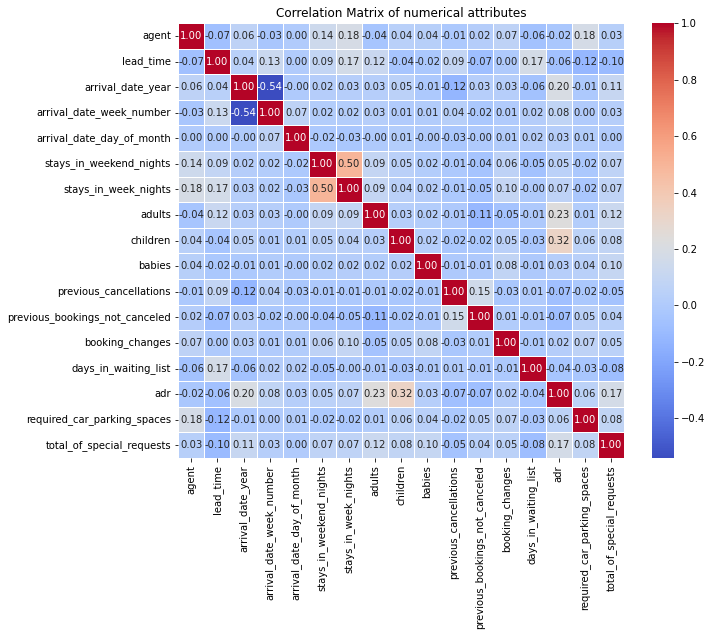

In [6]:
numerical_attributes = ['agent','lead_time','arrival_date_year','arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list' , 'adr', 'required_car_parking_spaces', 'total_of_special_requests']
numerical_data = data[numerical_attributes]

# Create a correlation matrix for numerical attributes
correlation_matrix_numerical = numerical_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap with a color scale indicating the level of correlation
sns.heatmap(correlation_matrix_numerical, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of numerical attributes')

# Show the plot
plt.show()

### Numerical and Binary Correlation Matrix

Now, we will also include the binary attributes in the matrix:

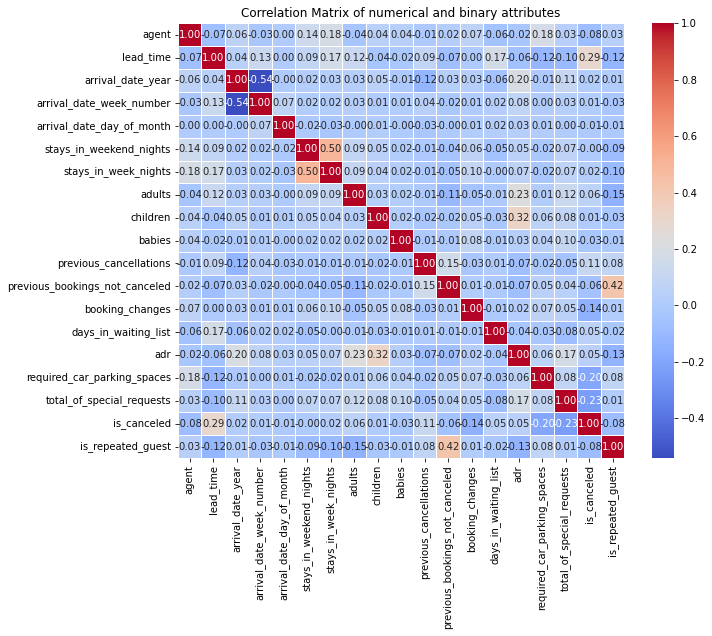

In [7]:
binary_attributes = ['is_canceled', 'is_repeated_guest']
binary_df = data[binary_attributes]

binary_data = pd.concat([numerical_data, binary_df], axis=1)

# Create a correlation matrix for numerical attributes
correlation_matrix_binary = binary_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap with a color scale indicating the level of correlation
sns.heatmap(correlation_matrix_binary, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of numerical and binary attributes')

# Show the plot
plt.show()

### Numerical, Binary and Categorical Correlation Matrix

We will now include also the categorical attributes in the matrix. However, since to compute correlations we need numeric values, we're going to use one-hot-encoding to create new binary attributes that represent the categorical ones.

In [8]:
categorical_attributes = ['hotel', 'arrival_date_month','meal','country', 'market_segment','distribution_channel', 'reserved_room_type','assigned_room_type' ,'deposit_type','agent','customer_type','reservation_status','reservation_status_date']
df_encoded = pd.get_dummies(data, columns=categorical_attributes)
len(df_encoded.columns)

1518

We cannot compute the correlation matrix for all the categorical variables using one-hot-encoding, since it would be a 1518x1518 matrix, and there would be too much (or none at all) information to extract. 

However, there are certain categorical attributes that do seem quite important, and that do not have that many categories to choose from. Let's try and choose them, one-hot-encode them to see if we can get a decent sized matrix then. We will keep the attributes 'hotel' (to see if it is the city or the resort hotel), as well as 'reserved_room' and 'assigned_room'.

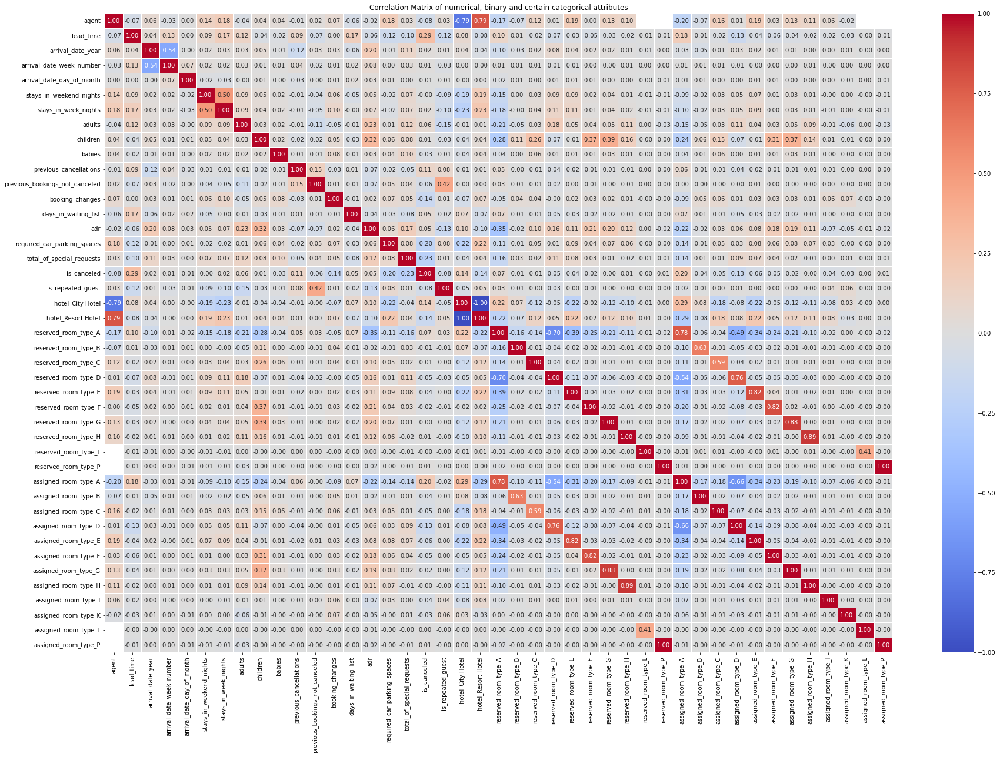

In [9]:
categorical_attributes_2 = ['hotel', 'reserved_room_type','assigned_room_type']
df_encoded_2 = pd.get_dummies(data, columns=categorical_attributes_2)

categorical_data = pd.concat([binary_data, df_encoded_2[['hotel_City Hotel','hotel_Resort Hotel', 'reserved_room_type_A', 'reserved_room_type_B',
       'reserved_room_type_C', 'reserved_room_type_D', 'reserved_room_type_E',
       'reserved_room_type_F', 'reserved_room_type_G', 'reserved_room_type_H',
       'reserved_room_type_L', 'reserved_room_type_P', 'assigned_room_type_A',
       'assigned_room_type_B', 'assigned_room_type_C', 'assigned_room_type_D',
       'assigned_room_type_E', 'assigned_room_type_F', 'assigned_room_type_G',
       'assigned_room_type_H', 'assigned_room_type_I', 'assigned_room_type_K',
       'assigned_room_type_L', 'assigned_room_type_P']]], axis=1)

# Create a correlation matrix for numerical attributes
correlation_matrix_categorical = categorical_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(30, 20))

# Create a heatmap with a color scale indicating the level of correlation
sns.heatmap(correlation_matrix_categorical, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of numerical, binary and certain categorical attributes')

# Show the plot
plt.show()


Now we have our correlation matrix of numeric and binary variables, as well as the 'hotel', 'assigned_room' and 'reserved_room' attributes using one-hot-encoding. As we could imagine, there is quite a high correlation between the assigned_room and reserved_room attributes, so it might be wise in the preprocessing steps to eliminate one of the two attributes.

## 2.3 Data Quality

### Missing values


We're now going to check the missing values of the dataset, although we already got that information on the profile report we did before. We'll check the results and try to explain those missing values.

In [10]:
# Check for missing values in the entire dataset
total_missing = data.isnull().sum().sum()

# Display the total number of missing values
print(f"Total Missing Values: {total_missing}")


Total Missing Values: 16832


In [11]:
# Check for missing values in each column
missing_per_column = data.isnull().sum()

# Display missing values per column, skipping columns with no missing values
print("Missing Values per Column:")
for column, missing_count in missing_per_column.iteritems():
    if missing_count > 0:
        print(f"{column}: {missing_count}")


Missing Values per Column:
children: 4
country: 488
agent: 16340


In [12]:
# Calculate percentage of missing values per column
missing_percentage_per_column = (data.isnull().sum() / len(data)) * 100

# Display missing percentage per column, skipping columns with no missing values
print("Percentage of Missing Values per Column:")
for column, missing_percentage in missing_percentage_per_column.iteritems():
    if missing_percentage > 0:
        print(f"{column}: {missing_percentage:.2f}%")

Percentage of Missing Values per Column:
children: 0.00%
country: 0.41%
agent: 13.69%


### Explanation of missing values

In [13]:
observations_with_null = data[data['children'].isnull()]
observations_with_null

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
40600,City Hotel,1,2,2015,August,32,3,1,0,2,...,0,No Deposit,NaN,0,Transient-Party,12.0,0,1,Canceled,2015-08-01
40667,City Hotel,1,1,2015,August,32,5,0,2,2,...,0,No Deposit,14.0,0,Transient-Party,12.0,0,1,Canceled,2015-08-04
40679,City Hotel,1,1,2015,August,32,5,0,2,3,...,0,No Deposit,NaN,0,Transient-Party,18.0,0,2,Canceled,2015-08-04
41160,City Hotel,1,8,2015,August,33,13,2,5,2,...,0,No Deposit,9.0,0,Transient-Party,76.5,0,1,Canceled,2015-08-09


$ Children $


As we can see here, the 4 observations which have 'children' null values were canceled. Hence, we could think that the parents did not say if there were kids or not in the reservation, and the hotel could not verify it since they did not go through with the reservation. Since these are only 4 observations which correspond to less than 0.01% of the dataset, if needed we could erase them without it affecting our results. 

In [14]:
observations_with_null = data[data['country'].isnull()]
observations_with_null.head(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
30,Resort Hotel,0,118,2015,July,27,1,4,10,1,...,2,No Deposit,NaN,0,Transient,62.0,0,2,Check-Out,2015-07-15
4127,Resort Hotel,1,0,2016,February,8,15,0,0,0,...,0,No Deposit,NaN,0,Transient,0.0,0,0,Canceled,2016-02-15
7092,Resort Hotel,1,8,2016,July,30,21,0,1,1,...,0,No Deposit,NaN,0,Transient,73.0,0,2,Canceled,2016-07-20
7860,Resort Hotel,1,39,2016,August,36,30,0,5,2,...,0,No Deposit,NaN,0,Transient,159.0,0,5,Canceled,2016-07-22
8779,Resort Hotel,1,0,2016,October,42,13,0,1,1,...,0,No Deposit,NaN,0,Transient,50.0,0,0,Canceled,2016-10-13


$ Country $

In the Country null values, we believe it might be possible that the country of origin of those clients was not recognised by the country in which the hotels are, which could explain why no value was inputted. Once again, these observations only amount for 0.41% of the data, which is almost negligible. If needed, we could erase them or input the top country (Portugal) to not lose more information.

$ Agent $ 

On the Agent attribute, however, there are 16340 observations with a null value, which corresponds to 13.7% of the dataset. Hence, we cannot eliminate all those observations. The agent attribute explains the ID of the travel agency that made the booking. We do not believe this attribute to be of much use, and furthermore, we can see that it is very highly correlated with the hotel attribute. Given this, we think the best idea is simply to drop this column and keep using the dataset without it, as there are too many null values to ignore them or fill them with the top Agent value. 

### Data provenance and Data cleansing

The data comes from the article [**Hotel booking demand datasets**](https://www.sciencedirect.com/science/article/pii/S2352340918315191) from Nuno Antonio, Ana Almeida, Luis Nunes. 

The data describes two datasets with information about hotel reservations. There are 2 types of hotels: a resort and a city hotel. The structure of the two datasets is identical, and every observation is a hotel reservation. Both databases include reservations scheduled to arrive between July 1, 2015, and August 31, 2017. 'Since this is hotel real data, all data elements pertaining hotel or costumer identification were deleted.'

Furthermore, the data was cleaned by Thomas Mock and Antoine Bichat as part of #TidyTuesday. The following code in Github explains how it was done: [**Github**](https://github.com/rfordatascience/tidytuesday/blob/master/data/2020/2020-02-11/readme.md).

This is probably why it has so few null values, the data is complete and anonimyzed correctly, and all the attribute's values make sense.

### Uneven distributions

Using the data profiling report from the beginning of the notebook, we can check that a lot of our attributes have a skewed distribution, due to the high number of zero values present in the data. However, this is not concerning for us, since those zero values make sense due to the nature of the attributes themselves. Some examples are the attributes 'babies', 'children', 'required_car_parking_spaces', and others.

## 2.4 Visual Exploration of the data

Now that we've explored our data, checked the correlations between the values and understand the attributes better, let's create some plots to try and see if there are any apparent relations or hypothesis we can formulate.

### Relation between 'adr' and 'children', 'adults'

One could guess that the price of a room might increase whenever the number of occupants increases, rather in a linearly fashion. Let's plot the scatterplots of 'adr' versus 'adults' and 'children' to check it out.

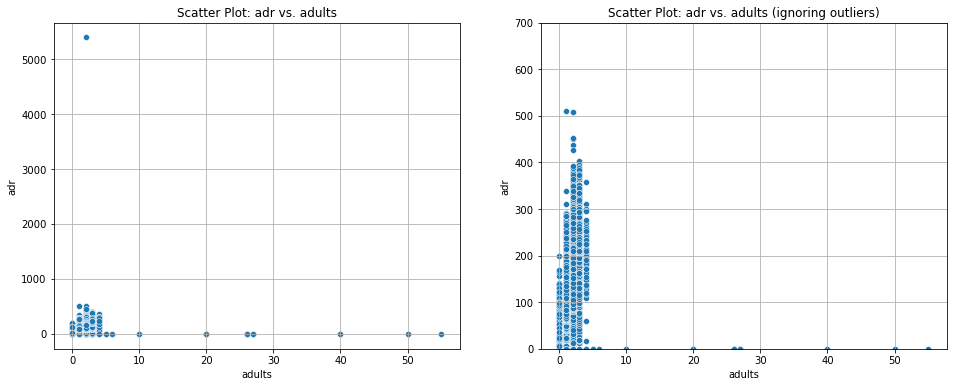

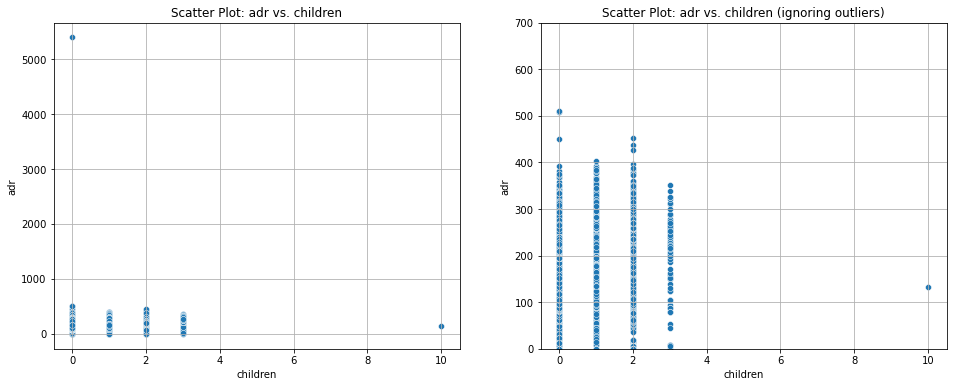

In [15]:
# Scatter plot between 'adr' and 'adults'
plt.figure(figsize=(16, 6))

# First scatter plot without xlim and ylim
plt.subplot(1, 2, 1)
sns.scatterplot(x='adults', y='adr', data=data)
plt.title('Scatter Plot: adr vs. adults')
plt.grid()

# Second scatter plot with xlim and ylim
plt.subplot(1, 2, 2)
sns.scatterplot(x='adults', y='adr', data=data)
plt.title('Scatter Plot: adr vs. adults (ignoring outliers)')
plt.ylim(0, 700)  # Adjust ylim based on your data
plt.grid()

plt.show()

# Scatter plot between 'adr' and 'children'
plt.figure(figsize=(16, 6))

# Third scatter plot without xlim and ylim
plt.subplot(1, 2, 1)
sns.scatterplot(x='children', y='adr', data=data)
plt.title('Scatter Plot: adr vs. children')
plt.grid()

# Fourth scatter plot with xlim and ylim
plt.subplot(1, 2, 2)
sns.scatterplot(x='children', y='adr', data=data)
plt.title('Scatter Plot: adr vs. children (ignoring outliers)')
plt.ylim(0, 700)  # Adjust ylim based on your data
plt.grid()

plt.show()

We can see there is a clear outlier in the 'adr' attribute, where the price is of around 5300. In order to better see the relation, we have plotted the scatterplots with the outlier, and then setting the x and y limits to ignore it.

After considering the plots, there does not seem to be an obvious linear relation between the average daily rate and the number of adults and children in the reservation. 

### Difference in the average 'adr' for the 2 types of hotels

Now, let's check if there is a clear difference between the average daily rate depending on the hotel we're in. This way, we could draw some conclusions to know if we will need to separate the dataset for our future regression model (if the 'adr' is too different, it might not make sense to make only one model when it should be two). 

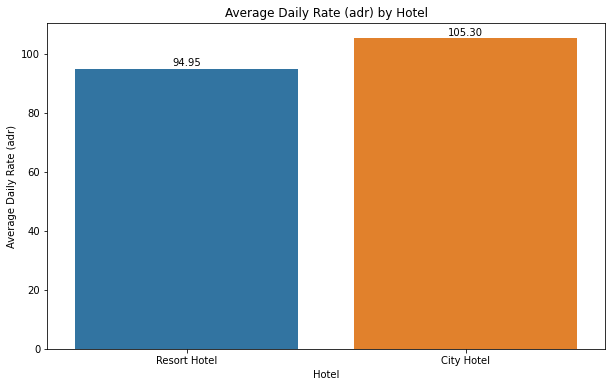

In [16]:
# Create a bar plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='hotel', y='adr', data=data, ci=None)  # Setting ci=None disables confidence intervals
plt.title('Average Daily Rate (adr) by Hotel')
plt.xlabel('Hotel')
plt.ylabel('Average Daily Rate (adr)')

# Get the maximum 'adr' value to determine the position of horizontal lines
max_adr = data['adr'].max()

for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2., p.get_height() + 1, f'{p.get_height():.2f}', ha='center')

plt.show()

We can see that the City Hotel is on average 10.35 euros more expensive than the resort hotel. This is not a massive difference, so we can be more assured of the integrity of the dataset.

### Relation between 'adr' and 'month_of_arrival'

As both hotels are in Portugal, which receives a very high number of tourists in the months of summer, let's check how the 'adr' evolves during the year, and if it reflects those fluctuations in the number of tourists.

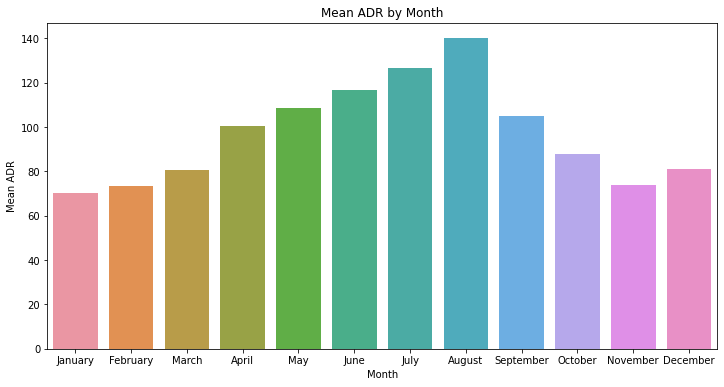

In [17]:
# Convert 'arrival_date_month' to a categorical variable with custom order
month_order = list(calendar.month_name)[1:]  # Exclude the empty string at index 0
data['arrival_date_month'] = pd.Categorical(data['arrival_date_month'], categories=month_order, ordered=True)

# Create a point plot with mean 'adr' values
plt.figure(figsize=(12, 6))
sns.barplot(x='arrival_date_month', y='adr', data=data, ci=None)
plt.title('Mean ADR by Month')
plt.xlabel('Month')
plt.ylabel('Mean ADR')
plt.show()

We can see that indeed, during the months of June, July and August, the 'adr' is at its highest of the year. We can also see a clear rise of the average daily rate as we approach those summer months.

### Relation between 'adr' and 'year_of_arrival'

Here, we simply want to check how the prices have evolved throughout the years present in the dataset. We want to check if staying in those hotels has been cheaper, equal or more extensive over the years.

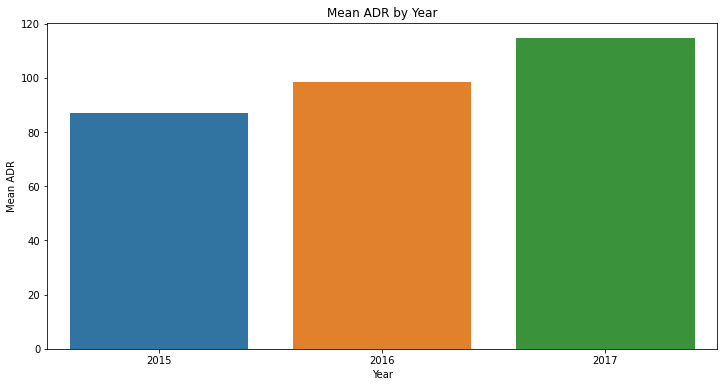

In [18]:
# Create a point plot with mean 'adr' values
plt.figure(figsize=(12, 6))
sns.barplot(x='arrival_date_year', y='adr', data=data, ci=None)
plt.title('Mean ADR by Year')
plt.xlabel('Year')
plt.ylabel('Mean ADR')
plt.show()

We can see a pretty clear increase in the adr over the years: this could be caused by inflation, the economy of the country, or simply the hotel's strategies. 

### Number of observations by arrival year

Now, let's take a look at the number of observations we have for each of the three years in the dataset.

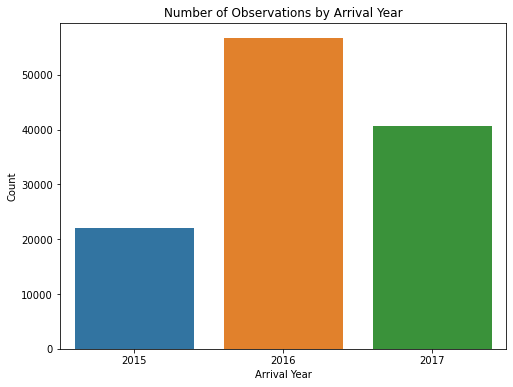

In [19]:
# Create a countplot for 'arrival_date_year'
plt.figure(figsize=(8, 6))
sns.countplot(x='arrival_date_year', data=data)
plt.title('Number of Observations by Arrival Year')
plt.xlabel('Arrival Year')
plt.ylabel('Count')
plt.show()

We can clearly see that we have the most information from reservations made in 2016. This is because the dataset does not include the whole 2015 and 2017 years, but it does include the whole 2016. Hence, it is fairly normal to get this plot. Ideally, we would have a similar number of observations from each year in order to have a more balanced dataset, but we do not think this will have much impact on our model. 

### 'adr' trends over time throughout the years

Finally, let's use a line plot to check the evolution of the 'adr' during the year, per week.

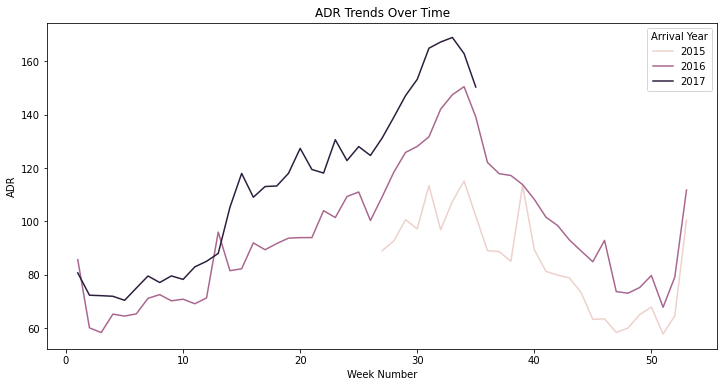

In [20]:
# Create a line plot for trends over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='arrival_date_week_number', y='adr', hue='arrival_date_year', data=data, ci=None)
plt.title('ADR Trends Over Time')
plt.xlabel('Week Number')
plt.ylabel('ADR')
plt.legend(title='Arrival Year')
plt.show()

During all three years we can see a clear peak in the summer months, around the weeks 30 to 40. This is similar to the results we got in a previous plot. 

## 2.5 Ethically sensitive data

Taking a look at the data, the way it has been cleaned and anonymized, there is really no ethically sensitive data to extract. One cannot know the race, sex, or any detail about any of the clients of neither hotel. The only possibility of sensitive data would be the attributes 'children' and 'babies', which do tell you something about the clients and possibly their familiar status. However, I do not think this is a big issue, since all the data is anonymized and impossible to track back to the families. 

There are, however, some unbalanced distributions inside the dataset, as we said before, that do need to be at least acknowledged, in order to fully understand what we're working with. 

We have to say that the number of observations from the City hotel is 79330 (66.4%) whereas the Resort Hotel only has 40060 observations (33.6%). We doubt this will affect our results negatively, but we do have to know that we have more information from the city than from the resort.

Secondly, on the country attribute, the most common country is Portugal, which makes sense since it is where the hotels are. However, it quadruples the second most common country of origin, so we may need to be cautious if using that variable for our model.

## 2.6 Potential risks and additional types of bias

As explained before, we do not think there is a real risk by using this dataset, thanks to the cleaning and preprocessing work of its authors. 

We would get an external expert to consult on the 'children' and 'babies' variables, to see if there is any possibility of the families being tracked and any personal information becoming public. 

We also think that the 'country' attribute could be a problem, but we doubt it will have weight in the regression, since the hotels cannot discriminate by country of origin to give prices for their rooms. So, if it is the case that this attribute is biased, it would then mean the hotels are doing something illegal, and discriminating their clients based on their nationality. 

Finally, as we said before, there is a big imbalance between the hotels in the dataset, but we do not think this will have a bias onto our results. 

## 2.7 Actions for Data Preparation


There are several actions needed for the Data Preparation phase in order to start working with our dataset. 

Firstly, we have to say that we already started this Data Preparation at the beginning of the notebook, by eliminating the column 'Company'. This column represented the ID of the company/entity that made the booking or was responsible for paying the booking. As it was filled at 95% with NaN values, we just thought it best to drop it at the beginning as it was giving us no useful information. 

Secondly, as stated before in the 'Missing values' part, we are going to drop the 'agent' column. It has too many missing values, we believe it might give us problems, and it is highly correlated with the hotel variables which could cause issues in the regression. 

Thirdly, we will erase the observations that have null values in the 'children' column. They correspond to less than 0.01% of the data, and we believe that the 'children' attribute may be important in the regression model. We do not want problems with the code and this way we are assured of that. 

Afterwards, we will drop the column 'arrival_date_year', as it is highly correlated with 'arrival_date_week_number', and thus it is not of much use.

Then, we will eliminate the outliers in the 'adr' column: there are two observations that can cause us problems. The first one has a negative adr, which is impossible because it would mean the hotel had to pay to the client for him to spend the night. This does not make sense, so we believe there was a mistake, and the easiest thing to do is simply to delete the observation. The second observation that might cause problems is the outlier which has an 'adr' value of 5400, which makes no sense in relation to the rest of the data. We also believe that there was a mistake in this reservation, and the adr value is erroneous. Hence, for it not to mess with our regression model, we will eliminate it. 

We will also drop the column 'assigned_room_type' since it is very highly correlated with 'reserved_room_type', and we do not want useless information. 

And finally, we will drop all columns that are not numerical or binary attributes, excepting 'hotel' and 'reserved_room_type'. For those two attributes, we will use one-hot-encoding in order to turn them into a set of binary attributes that represent those categories. After careful consideration, we believe that having 31 attributes is too much for our regression model. Furthermore, most of the categorical variables have too many categories to be able to do one-hot-encoding and work with them, and we believe that most of them are practically useless when trying to predict 'adr'.

We also thought of using over or under-sampling in order to create a more balanced dataset in relation with the 'hotel' attribute, but after thinking it through, we have decided against it. We do not want to lose information while under-sampling nor create 'recycled' observations through over-sampling, and we do not think the data is too imbalanced for it to mess with our models. 

However, what we do want to do is separate the data into two subsets: the first subset will be the complete dataset, all together. The second subset will have the data separated by their 'hotel' value: this way, we will create a regression to predict 'adr' for both hotels combined, and also for each hotel separately. We will do this in order to check if the model differs a lot between the hotels, or if on the other hand, the type of hotel is not very important to decide the 'adr'.

# Task 2: Data Preparation Report

## 3.1: Data Preprocessing

#### Dropping 'company' column

We dropped the 'company' column at the beginning of the notebook by using the following code: 

$ data = data.drop('company',axis=1) $ 

#### Dropping 'agent' column

In [21]:
data = data.drop('agent',axis=1)

#### Dropping observation with null values in 'children'

In [22]:
data = data.dropna(subset=['children'])

# Reset the index after removing rows
data = data.reset_index(drop=True)

#### Dropping 'arrival_date_year' column

In [23]:
data = data.drop('arrival_date_year',axis=1)

#### Dropping 'adr' outliers

In [24]:
# Drop rows where 'adr' is negative or equal to 5400
data = data[(data['adr'] >= 0) & (data['adr'] != 5400)]

# Reset the index after removing rows
data = data.reset_index(drop=True)

#### Dropping 'assigned_room_type' column

In [25]:
data = data.drop('assigned_room_type',axis=1)

#### Dropping all non-numerical or binary columns, except 'hotel' and 'reserved_room_type'

In [26]:
# List of columns to keep
columns_to_keep = ['reserved_room_type']

# Identify numerical and binary columns
numerical_columns = data.select_dtypes(include=['number']).columns
binary_columns = [col for col in data.columns if data[col].nunique() == 2]

# Exclude 'is_canceled' and 'is_repeated_guest' from binary columns if they are already present
binary_columns = [col for col in binary_columns if col not in ['is_canceled', 'is_repeated_guest']]

# Combine the columns to keep with numerical and binary columns
columns_to_keep += list(numerical_columns) + binary_columns

# Keep only the selected columns
data = data[columns_to_keep]

# Reset the index after selecting columns
data = data.reset_index(drop=True)

#### One-hot-encoding for 'hotel' and 'reserved_room_type'

In [27]:
# List of categorical columns for one-hot encoding
categorical_columns = ['hotel', 'reserved_room_type']

# Perform one-hot encoding on the specified categorical columns
data_final = pd.get_dummies(data, columns=categorical_columns, drop_first=False)

# Reset the index after encoding
data_final = data_final.reset_index(drop=True)


Check the dataset is correctly created:

In [28]:
data_final.head(5)

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0,342,27,1,0,0,2,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,737,27,1,0,0,2,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,7,27,1,0,1,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,13,27,1,0,1,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,14,27,1,0,2,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0


#### Create the two working subsets for the model

In [29]:
# Filter observations for City Hotel
data_city = data_final[data_final['hotel_City Hotel'] == 1].copy()

# Filter observations for Resort Hotel
data_resort = data_final[data_final['hotel_Resort Hotel'] == 1].copy()

# Reset the index for both datasets
data_city = data_city.reset_index(drop=True)
data_resort = data_resort.reset_index(drop=True)

Check that both datasets have indeed been created correctly:

In [30]:
data_city

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0,6,27,1,0,2,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,1,88,27,1,0,4,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,1,65,27,1,0,4,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,1,92,27,1,2,4,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,1,100,27,2,0,2,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79320,0,23,35,30,2,5,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
79321,0,102,35,31,2,5,3,0.0,0,0,...,0,0,0,0,1,0,0,0,0,0
79322,0,34,35,31,2,5,2,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0
79323,0,109,35,31,2,5,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [31]:
data_resort

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0,342,27,1,0,0,2,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,737,27,1,0,0,2,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,7,27,1,0,1,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,13,27,1,0,1,1,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,14,27,1,0,2,2,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40054,0,212,35,31,2,8,2,1.0,0,0,...,1,0,0,0,0,0,0,0,0,0
40055,0,169,35,30,2,9,2,0.0,0,0,...,0,0,0,0,1,0,0,0,0,0
40056,0,204,35,29,4,10,2,0.0,0,0,...,0,0,0,0,1,0,0,0,0,0
40057,0,211,35,31,4,10,2,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0


## 3.2: Derived Attributes

After some consideration, we've managed to find some derived attributes that might be helpful for our business objectives. 

Firstly, we've already done it, but one-hot-encoding our categorical variables 'hotel' and 'reserved_room_type', in order to get binary attributes that can be used in our regression model, is the first step in our derived attributes. 

Secondly, we will create a new attribute for each reservation, called 'total_guests'. This will simply be the sum for 'adults', 'children' and 'babies' for each observation. This way, we will see if the category of each person is important, or if simply the total number of people has a greater effect on the 'adr'. The only problem we see with this is the high correlation this attribute will have with the three it is composed of. 

Then, we will also create the attribute 'total_nights_stay', which will simply be the sum of 'stays_in_weekend_nights' and 'stays_in_week_nights'. Once agai, this will be helpful in determining if there is a difference in staying during the weekend, or if the 'adr' is simply determined by the total number of nights. 

We've also considered the use of binning for the 'lead_time' attribute, in order to create three categories: short-term, mid-term and long-term reservation. However, we believe this new way of looking at the lead_time attribute could be helpful if we were trying to study the clients' vacation habits, but we do not see the utility for our business objectives. Furthermore, it would only cause problems in our regression model. 

Furthermore, we thought about creating a binary indicator for the 'booking_changes' variable, instead of it being a numerical attribute. However, after more consideration, we reached the conclusion that we cannot know if the actual number of changes is important, and thus we do not want to lose information by changing it to a binary variable with only 0 or 1 possible values.

Finally, we also will add a 'family' attribute, which will simply be a binary variable with value 1 if the reservation has 'children' and / or 'babies' different than 0. We think this might be helpful to quickly recognize if the reservation belongs to a family vacation, and study the 'adr' based on that. 

The last derived attribute we thought of is 'booking_window': calculate the difference between 'lead_time' and 'days_in_waiting_list' to represent the effective booking window of each reservation. However, we thought this could be interesting if we wanted to study the client's habits, but it does not really align with our use of the data in this case.

We will proceed with the changes in the section 3.4, along with describing all the preprocessing steps made to the data. 

## 3.3: External Data Sources

Given how complete our dataset is, we find it hard to find external data that could be useful for us to better predict 'adr'. However, there is some information that could be of use. 

Firstly, we believe having surveys of clients after they've checked out, rating their stay from 1 to 10, could be useful in order to better understand how satisfied they were with the services. This could bring us a better understanding of the hotel, if people will or will not come back, etc.

Secondly, we could insert into the dataset a local events calendar, to check if the reservation coincides with a local holiday, big conference in the area or any festivals. This could be useful to understand the fluctuations of the 'adr', since normally these events attract more people, and that raises the prices. 

Lastly, having a calendar of local Economic Development Plans could also help. By exploring local economic development plans or projects that might attract visitors and impact hotel demand, we could have a better shot at predicting the 'adr', since as we said before, that could be a reason to increase prices for hotels.

After consideration, we won't be applying any of this external data, since we do not think the complications it would bring would be worth it for the prediction model.

## 3.4: All pre-processing steps

Finally, we're going to recap all pre-processing steps applied to the data: 

- Dropping the columns 'company', 'agent', 'arrival_date_year', 'assigned_room_type', as well as all other categorical attributes except 'hotel' and 'reserved_room_type'

- Deleting observations with 'children' values as null and the two 'adr' outliers

- One-hot-encoding the 'hotel' and 'reserved_room_type' variables to transform them into binary attributes

- Creating the two subsets for the future regression model: one with the whole dataset, and then two dataframes containing each information from each hotel

- Now, we're going to create the following attributes: 'total_guests', 'total_nights_stay' and 'family', which will be created following the directions given in section 3.2. 

We do not need to scale our data given its nature, and thanks to the cleaning and preprocessing work done by the authors of the dataset, this is everything we need to do. 

#### Creation of 'total_guests'

In [32]:
# Create 'total_guests' for the data that is not separated
data_final['total_guests'] = data_final['adults'] + data_final['children'] + data_final['babies']

# Create 'total_guests' for the city hotel dataframe
data_city['total_guests'] = data_city['adults'] + data_city['children'] + data_city['babies']

# Create 'total_guests' for the resort hotel dataframe
data_resort['total_guests'] = data_resort['adults'] + data_resort['children'] + data_resort['babies']

#### Creation of 'total_nights_stay'

In [33]:
# Create 'total_nights_stay' for the data that is not separated
data_final['total_nights_stay'] = data_final['stays_in_weekend_nights'] + data_final['stays_in_week_nights']

# Create 'total_nights_stay' for the city hotel dataframe
data_city['total_nights_stay'] = data_city['stays_in_weekend_nights'] + data_city['stays_in_week_nights']

# Create 'total_nights_stay' for the resort hotel dataframe
data_resort['total_nights_stay'] = data_resort['stays_in_weekend_nights'] + data_resort['stays_in_week_nights']

#### Creation of 'family'

In [34]:
# Create 'family' for the data that is not separated
data_final['family'] = (data_final['children'] + data_final['babies']).apply(lambda x: 1 if x > 0 else 0)

# Create 'family' for the city hotel dataframe
data_city['family'] = (data_city['children'] + data_city['babies']).apply(lambda x: 1 if x > 0 else 0)

# Create 'family' for the resort hotel dataframe
data_resort['family'] = (data_resort['children'] + data_resort['babies']).apply(lambda x: 1 if x > 0 else 0)

Check that all attributes have been correctly created:

In [35]:
data_final.head(3)

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P,total_guests,total_nights_stay,family
0,0,342,27,1,0,0,2,0.0,0,0,...,0,0,0,0,0,0,0,2.0,0,0
1,0,737,27,1,0,0,2,0.0,0,0,...,0,0,0,0,0,0,0,2.0,0,0
2,0,7,27,1,0,1,1,0.0,0,0,...,0,0,0,0,0,0,0,1.0,1,0


In [36]:
data_city.head(3)

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P,total_guests,total_nights_stay,family
0,0,6,27,1,0,2,1,0.0,0,0,...,0,0,0,0,0,0,0,1.0,2,0
1,1,88,27,1,0,4,2,0.0,0,0,...,0,0,0,0,0,0,0,2.0,4,0
2,1,65,27,1,0,4,1,0.0,0,0,...,0,0,0,0,0,0,0,1.0,4,0


In [37]:
data_resort.head(3)

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P,total_guests,total_nights_stay,family
0,0,342,27,1,0,0,2,0.0,0,0,...,0,0,0,0,0,0,0,2.0,0,0
1,0,737,27,1,0,0,2,0.0,0,0,...,0,0,0,0,0,0,0,2.0,0,0
2,0,7,27,1,0,1,1,0.0,0,0,...,0,0,0,0,0,0,0,1.0,1,0
